# Generierung eigener Rhythmen basierend auf Datenanalyse von Schlagzeug Sequenzen durch Markov-Ketten 
### Generating unique rhythms based upon data analysis of drum loops by using Markov chains

Schlagzeug Sequenzen, sogenannte Drum-Loops, sind ein beliebtes Tool in der Musikindustrie: Interpreten können mithilfe dieser Loops selbst Demos erstellen oder ganze Stücke produzieren. Jedoch gestaltet sich die Auswahl als schwierig, wenn man kein versierter Schlagzeuger ist und kaum unterschiedlichen Stilistiken kennt. Das Ziel dieser Arbeit ist es dieses Problem zu lösen und die Auswahl von Schlagzeug Sequenzen zu vereinfachen. Es wird eine Datenbank aus Schlagzeug-Sequenzen erstellt und ein Programm welches diese Sequenzen verarbeitet und mithilfe von Markov-Ketten und des Viterbi-Algorithmus basierend auf der Datenbank künstliche Sequenzen generieren kann. Das [Essentia Framework](https://essentia.upf.edu/) dient hierbei als Grundlage.

Zu allererst importieren wir die benötigten Frameworks:

In [1]:
import markov_groove as mg
from pomegranate import DiscreteDistribution, LogNormalDistribution, NormalDistribution, MultivariateGaussianDistribution, BernoulliDistribution, UniformDistribution, HiddenMarkovModel
from pretty_midi import PrettyMIDI
import IPython
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from pathlib import Path
sns.set(style="darkgrid")


%load_ext watermark
%watermark -m -n -p numpy,scipy,pomegranate,essentia,markov_groove

Tue Sep 15 2020 

numpy 1.18.2
scipy 1.5.2
pomegranate 0.13.4
essentia 2.1b6.dev184
markov_groove 0.1.0

compiler   : GCC 10.2.0
system     : Linux
release    : 5.8.6-1-MANJARO
machine    : x86_64
processor  : 
CPU cores  : 8
interpreter: 64bit


### Einlesen der Dateien

Nun lesen wir die Dateien ein und definieren unsere Parameter:

In [2]:
# Definiere Parameter:
disco = mg.util.read_audio_files("/home/jan_dev/loops/disco", "*/*.*")
techno = mg.util.read_audio_files("/home/jan_dev/loops/techno", "*/*.*")
ballad_mid = mg.util.read_midi_files("/home/jan_dev/loops/groove/drummer9/session1", "*.mid")
bpm = 125
beats = 8
steps = 128



disco_sequencers, disco_samples = mg.util.create_knowledge_base(
    disco, mg.OnsetAlgorithm.COMPLEX, beats, steps
)
techno_sequencers, techno_samples = mg.util.create_knowledge_base(
    techno, mg.OnsetAlgorithm.COMPLEX, beats, steps
)

ballad_sequencers = [mg.MidiSequencer.from_file(mid, bpm, beats, steps) for mid in ballad_mid]

[(0, 0.00125)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.00125)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.00125)]
480
[(0, 0.00125)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.00125)]
480
[(0, 0.00125)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.00125)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.00125)]
480
[(0, 0.0013888895833333334)]
480
[(0, 0.00125)]
480
[(0, 0.00125)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.00125)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.00125)]
480
[(0, 0.0010416666666666667)]
480
[(0, 0.0010416666666666667)]
480


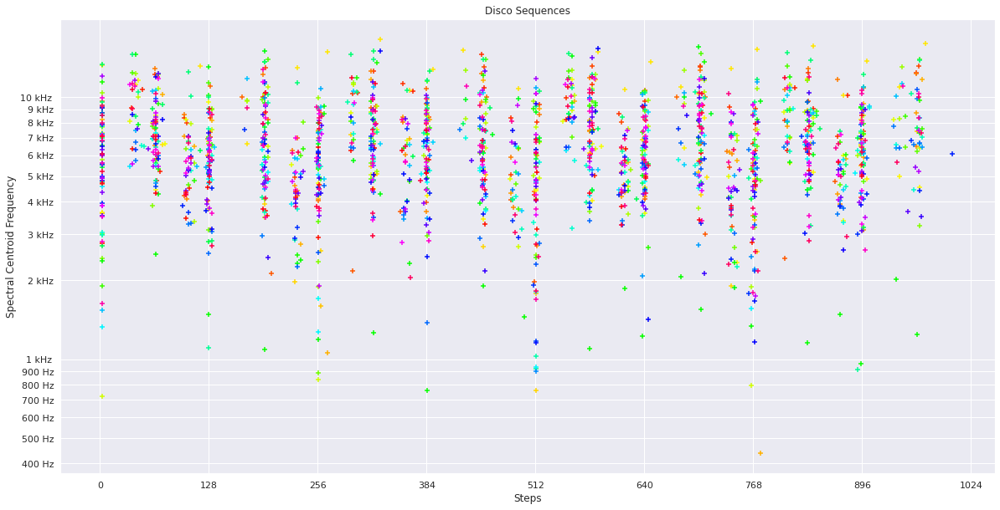

In [3]:
# Plot all disco sequences
colors = cm.hsv(np.linspace(0, 1, len(disco_sequencers)))
_, ax = plt.subplots(figsize=(20, 10))
for sequencer, color in zip(disco_sequencers, colors):
    sequencer.visualize(ax, color)
plt.title("Disco Sequences")
plt.ylabel("Spectral Centroid Frequency")
plt.xlabel("Steps")
plt.show()
# print(f"Zeige {len(disco_sequencers)} Sequenzen. Insgesamt {len(disco_samples)} Samples.")

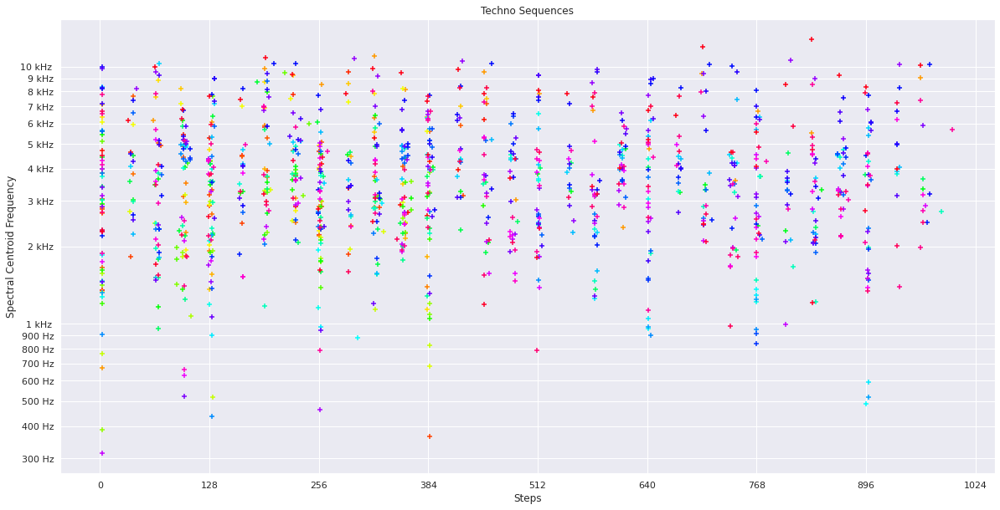

In [4]:
# Plot all techno sequences
colors = cm.hsv(np.linspace(0, 1, len(techno_sequencers)))
_, ax = plt.subplots(figsize=(20, 10))
for sequencer, color in zip(techno_sequencers, colors):
    sequencer.visualize(ax, color)
plt.title("Techno Sequences")
plt.ylabel("Spectral Centroid Frequency")
plt.xlabel("Steps")
plt.show()
# print(f"Zeige {len(techno_sequencers)} Sequenzen. Insgesamt {len(techno_samples)} Samples.")

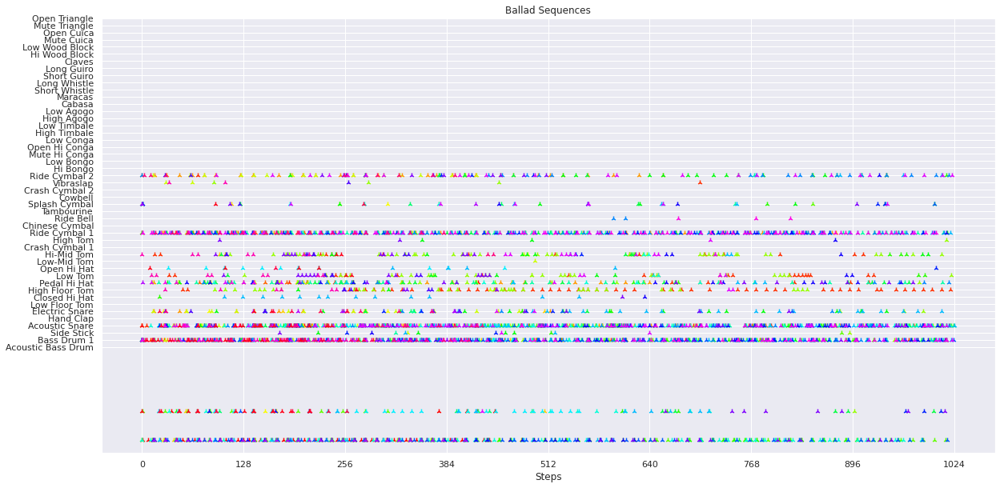

In [5]:
# Plot all ballad sequences
colors = cm.hsv(np.linspace(0, 1, len(ballad_sequencers)))
_, ax = plt.subplots(figsize=(20, 10))
for sequencer, color in zip(ballad_sequencers, colors):
    sequencer.visualize(ax, color)
plt.title("Ballad Sequences")
plt.xlabel("Steps")
plt.yticks(range(35, 82))
plt.show()

Nun intialisieren das Generative Model:

In [6]:
for x in [np.nan_to_num(seq.pattern.transpose()[1], nan=1) for seq in disco_sequencers][0]:
    print(x)

1.0
1.0
1.0
6049.2466
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
5838.427
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
4546.4233
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
6544.585
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.

In [37]:
def change_pattern(seq):
    return [[1, value] if not np.isnan(value) else [0, value] for idx, value in seq.pattern]

In [38]:
my_data = [change_pattern(seq) for seq in disco_sequencers]

In [39]:
test_hidden_model = HiddenMarkovModel.from_samples(
    [BernoulliDistribution, LogNormalDistribution],
    n_components=5,
    X=my_data,
    name="testo",
    verbose=True,
)

8e-07	Time (s): 0.1203
[1515] Improvement: 1.1707379599101841e-07	Time (s): 0.1216
[1516] Improvement: 1.1715383152477443e-07	Time (s): 0.1219
[1517] Improvement: 1.1462543625384569e-07	Time (s): 0.1222
[1518] Improvement: 1.1281736078672111e-07	Time (s): 0.1198
[1519] Improvement: 1.1187512427568436e-07	Time (s): 0.1231
[1520] Improvement: 1.1131123756058514e-07	Time (s): 0.1249
[1521] Improvement: 1.0888106771744788e-07	Time (s): 0.1258
[1522] Improvement: 1.0779331205412745e-07	Time (s): 0.1204
[1523] Improvement: 1.0664734872989357e-07	Time (s): 0.1234
[1524] Improvement: 1.0576695785857737e-07	Time (s): 0.1204
[1525] Improvement: 1.0448638931848109e-07	Time (s): 0.1215
[1526] Improvement: 1.0294752428308129e-07	Time (s): 0.1187
[1527] Improvement: 1.0212170309387147e-07	Time (s): 0.1205
[1528] Improvement: 9.961513569578528e-08	Time (s): 0.1175
[1529] Improvement: 9.986615623347461e-08	Time (s): 0.122
[1530] Improvement: 9.703944670036435e-08	Time (s): 0.1206
[1531] Improvement: 9

In [162]:
sequence = test_hidden_model.sample(length=beats * steps+1)
sequence = [[0, value] if key == 1 else [0,np.nan] for key, value in sequence]

In [163]:
sequencer = mg.AudioSequencer(sequence, bpm, beats, steps)

In [164]:
def find_closestt(array, value):
    idx = (np.abs(array - np.float64(value))).argmin()
    return array[idx]


def find_closest_samples(sequencer, samples):
    for idx, key in enumerate(sequencer.pattern.copy()):
        if not np.isnan(key[1]):
            sequencer.pattern[idx] = [idx, find_closestt(np.fromiter(disco_samples.keys(), dtype=np.float32), key[1])]

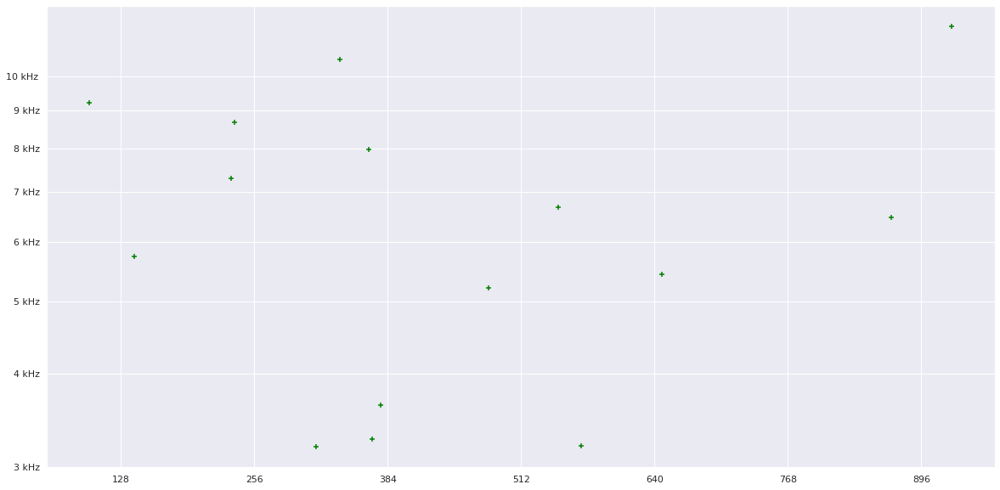

In [165]:
_, ax = plt.subplots(figsize=(20, 10))
sequencer.visualize(ax, "green")

In [166]:
find_closest_samples(sequencer, disco_samples)

In [167]:
new_samples = [disco_samples[freq] for _, freq in sequencer.pattern if not np.isnan(freq)]
new_beat = sequencer.create_beat(new_samples)

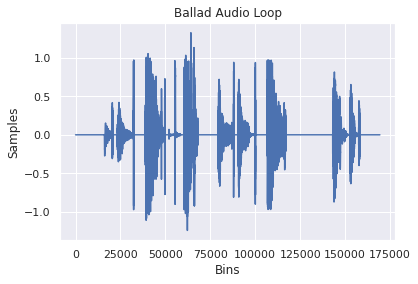

In [168]:
plt.plot(new_beat.audio)
plt.title("Ballad Audio Loop")
plt.ylabel("Samples")
plt.xlabel("Bins")
plt.show()

In [169]:
new_beat.display()

In [18]:
disco_hidden_model = HiddenMarkovModel.from_samples(
    LogNormalDistribution,
    n_components=3,
    X=[seq.pattern.transpose()[1] for seq in disco_sequencers],
    name="disco",
    verbose=True,
)
techno_hidden_model = HiddenMarkovModel.from_samples(
    LogNormalDistribution,
    n_components=3,
    X=[seq.pattern.transpose()[1] for seq in techno_sequencers],
    name="techno",
    verbose=True,
)
ballad_hidden_model = HiddenMarkovModel.from_samples(
    DiscreteDistribution,
    n_components=8,
    X=[seq.encode() for seq in ballad_sequencers],
    name="ballad",
    verbose=True,
)

print("Alle Modelle wurden initialisiert und trainiert!")


Improvement: 0.6118428007521288	Time (s): 0.04067
[255] Improvement: 0.6074364893429447	Time (s): 0.04073
[256] Improvement: 0.6045250925872097	Time (s): 0.04129
[257] Improvement: 0.6028622585763515	Time (s): 0.04084
[258] Improvement: 0.6022027326471289	Time (s): 0.0406
[259] Improvement: 0.6023020665925287	Time (s): 0.04054
[260] Improvement: 0.6029173307924793	Time (s): 0.04077
[261] Improvement: 0.6038087187662313	Time (s): 0.04124
[262] Improvement: 0.6047419612968952	Time (s): 0.04057
[263] Improvement: 0.6054914623800869	Time (s): 0.04062
[264] Improvement: 0.6058440075721592	Time (s): 0.04074
[265] Improvement: 0.6056028499533568	Time (s): 0.0413
[266] Improvement: 0.6045919117368612	Time (s): 0.04034
[267] Improvement: 0.6026598135376844	Time (s): 0.03994
[268] Improvement: 0.5996834316392778	Time (s): 0.03975
[269] Improvement: 0.5955706900676887	Time (s): 0.04072
[270] Improvement: 0.5902623683195998	Time (s): 0.04001
[271] Improvement: 0.5837327464050759	Time (s): 0.03971


In [10]:
ballad_hidden_model = HiddenMarkovModel.from_samples(
    DiscreteDistribution,
    n_components=4,
    X=[seq.encode() for seq in ballad_sequencers],
    name="ballad",
    verbose=True,
    n_jobs=6
)

7333303988e-08	Time (s): 0.02667
[2929] Improvement: 2.0500010577961802e-08	Time (s): 0.02576
[2930] Improvement: 2.0161678548902273e-08	Time (s): 0.02752
[2931] Improvement: 2.0179868442937732e-08	Time (s): 0.02673
[2932] Improvement: 2.0307197701185942e-08	Time (s): 0.02801
[2933] Improvement: 1.998705556616187e-08	Time (s): 0.02745
[2934] Improvement: 1.9161234376952052e-08	Time (s): 0.02547
[2935] Improvement: 1.939042704179883e-08	Time (s): 0.02518
[2936] Improvement: 1.9546860130503774e-08	Time (s): 0.02731
[2937] Improvement: 1.9506842363625765e-08	Time (s): 0.02562
[2938] Improvement: 1.8546415958553553e-08	Time (s): 0.02502
[2939] Improvement: 1.941225491464138e-08	Time (s): 0.02645
[2940] Improvement: 1.9044819055125117e-08	Time (s): 0.02902
[2941] Improvement: 1.8237187759950757e-08	Time (s): 0.02857
[2942] Improvement: 1.864464138634503e-08	Time (s): 0.02706
[2943] Improvement: 1.7811544239521027e-08	Time (s): 0.02508
[2944] Improvement: 1.8491846276447177e-08	Time (s): 0.0

In [31]:
rangee = np.arange(0, beats * steps + 1)
ballad_hidden_model.states[0]


                "45,735;" : 0.0,
                "45,737;" : 5.974000035954083e-05,
                "45,739;" : 5.974000035913333e-05,
                "45,745;" : 5.974000035913333e-05,
                "45,797;" : 0.0,
                "45,804;" : 0.0,
                "45,809;" : 0.0,
                "45,815;" : 0.0,
                "45,816;" : 0.0,
                "45,827;" : 0.0,
                "45,82;" : 0.0,
                "45,832;" : 0.0,
                "45,836;" : 0.0,
                "45,839;" : 0.0,
                "45,842;" : 0.0,
                "45,888;" : 0.0,
                "45,88;" : 0.0,
                "45,895;" : 0.0,
                "45,915;" : 0.0,
                "45,922;" : 0.0,
                "45,979;" : 5.9740000359690245e-05,
                "45,987;" : 5.974000035964949e-05,
                "46,1001;" : 0.0,
                "46,104;" : 5e-324,
                "46,10;" : 0.0,
                "46,127;" : 0.0,
                "46,168;" : 5.9740000359523847e-0

In [30]:
for seq in ballad_sequencers:
    print(ballad_hidden_model.log_probability(seq.encode()))

-752.7611290425994
-1670.2762693427
-321.83053677520286
-1284.2712571065579
-806.8980390999332
-361.49486905547917
-832.3047681074429
-1638.6309498440837
-1176.8751577121084
-1206.4688352106343
-1351.276443070416
-1150.755081128809
-560.0693542244176
-1140.233143909771
-1486.6808278975031
-879.4132670418945
-1546.5859018419976
-1548.949689712189
-1169.364348481942
-1130.540702055347
-1364.5643424542611
-534.5492823235704
-1371.5425938230628
-504.04327379463496
-1880.2035067344566
-1205.9706096897073
-496.77742727680544
-711.1310116044385
-434.7801378896713
-473.8985689943363


In [17]:
ballad_beat = ballad_sequencers[8].create_beat()
ballad_beat.display(autoplay=True)

In [19]:
ballad_hidden_sequence = ballad_hidden_model.sample(length=beats * steps+1)
new_ballad_seq = mg.MidiSequencer.decode(ballad_hidden_sequence, 120, beats, steps)
ballad_beat = new_ballad_seq.create_beat()
ballad_beat.display(autoplay=True)

In [8]:
# Genriere neue Sequenz mit HMM
disco_hidden_sequence = disco_hidden_model.sample(length=beats * steps+1)
techno_hidden_sequence = techno_hidden_model.sample(length=beats * steps+1)
ballad_hidden_sequence = ballad_hidden_model.sample(length=beats * steps+1)
print("HMM Sequenzen wurden generiert!")

# Kreiere neue Sequencer
new_disco_seq =  mg.AudioSequencer.decode(disco_hidden_sequence, bpm, beats, steps)
new_disco_beat_samples = [disco_samples[freq] for _, freq in new_disco_seq.pattern if not np.isnan(freq)]

new_techno_seq =  mg.AudioSequencer.decode(techno_hidden_sequence, bpm, beats, steps)
new_techno_beat_samples = [techno_samples[freq] for _, freq in new_techno_seq.pattern if not np.isnan(freq)]

new_ballad_seq = mg.MidiSequencer.decode(ballad_hidden_sequence)

# Kreiere neue Schlagzeugsequenzen
disco_beat =  new_disco_seq.create_beat(samples=new_disco_beat_samples)
techno_beat =  new_techno_seq.create_beat(samples=new_techno_beat_samples)
ballad_beat = new_ballad_seq.create_beat()
print("Schlagzeugsequenzen erstellt!")

HMM Sequenzen wurden generiert!
Schlagzeugsequenzen erstellt!


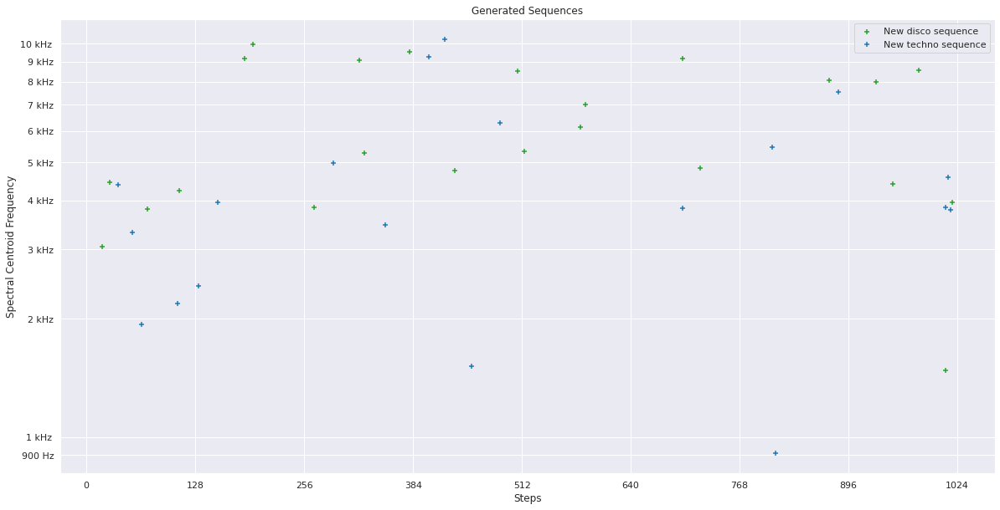

In [23]:
# Plot newly created sequences
_, ax = plt.subplots(figsize=(20, 10))
new_disco_seq.visualize(ax, "tab:green")
new_techno_seq.visualize(ax, "tab:blue")
ax.legend(["New disco sequence", "New techno sequence"])
plt.title("Generated Sequences")
plt.ylabel("Spectral Centroid Frequency")
plt.xlabel("Steps")
plt.show()

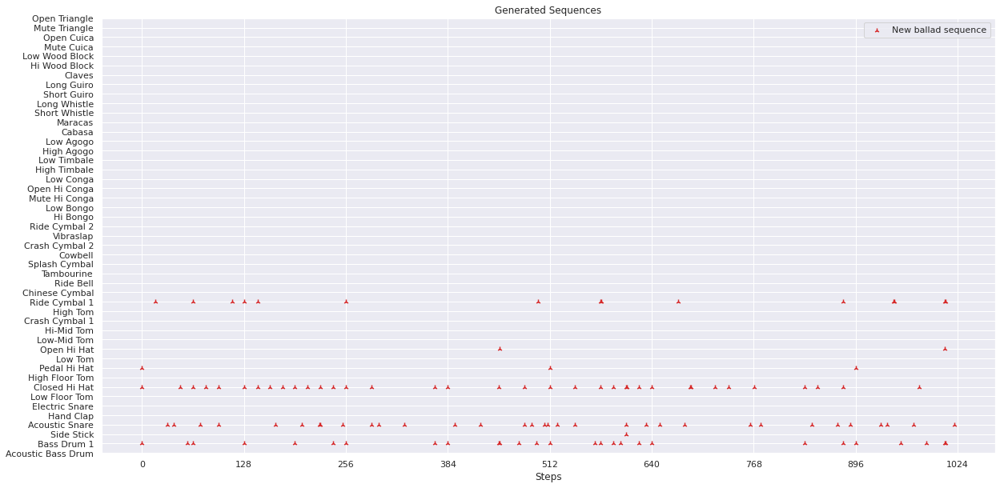

In [9]:
# Plot newly created sequences
_, ax = plt.subplots(figsize=(20, 10))
new_ballad_seq.visualize(ax, "tab:red")
ax.legend(["New ballad sequence"])
plt.title("Generated Sequences")
plt.xlabel("Steps")
plt.yticks(range(35, 82))
plt.show()

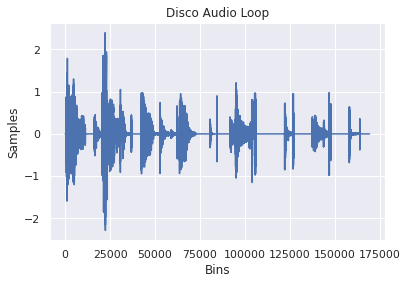

In [11]:
plt.plot(disco_beat.audio)
plt.title("Disco Audio Loop")
plt.ylabel("Samples")
plt.xlabel("Bins")
plt.show()

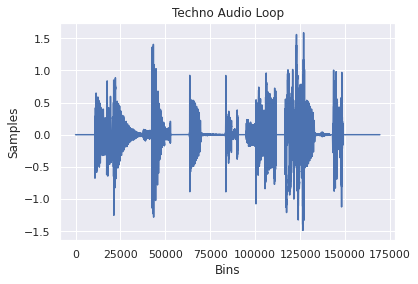

In [12]:
plt.plot(techno_beat.audio)
plt.title("Techno Audio Loop")
plt.ylabel("Samples")
plt.xlabel("Bins")
plt.show()

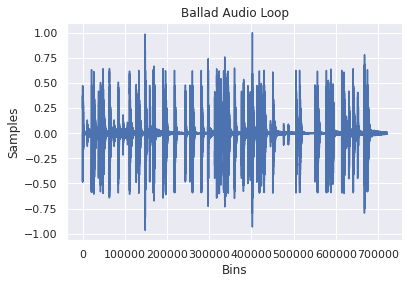

In [10]:
plt.plot(ballad_beat.audio)
plt.title("Ballad Audio Loop")
plt.ylabel("Samples")
plt.xlabel("Bins")
plt.show()

In [14]:
disco_beat.save(Path(".temp/disco_audio.wav"))
techno_beat.save(Path(".temp/techno_audio.wav"))
ballad_beat.save(Path(".temp/ballad_audio.wav"))
print("Dateien abgespeichert!")

Dateien abgespeichert!


In [18]:
disco_beat.display()

In [20]:
techno_beat.display()

In [11]:
ballad_beat.display()